### The University of Melbourne, School of Computing and Information Systems
# COMP90086 Computer Vision, 2021 Semester 2

## Assignment 3

**Student Name:**    `Jiawei Luo`

**Student ID:**     `1114028`

This iPython notebook is a template which you should use for your Assignment 3 submission. This file should be submitted at the **Assignment 3: Code** link on the LMS, along with any images needed to run your code.

In addition to this file, you should submit a writren report explaining your results at the **Assignment 3: Report** link on the LMS. Please see the assignment specification for details on what must be included in the report for each question.

*Adding proper comments to your code is MANDATORY.*

### 1. Detect lines in the image
Use the Canny edge detector and Hough transform to detect lines in the image.

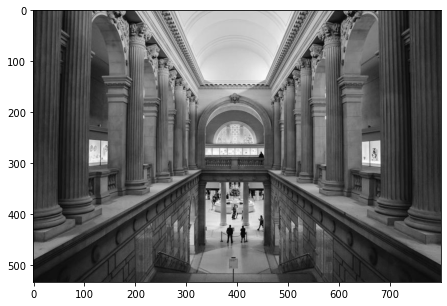

In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np


# load images， Start with trying one image for test
img3 = cv2.imread('COMP90086_asst3_2021_images/img3.jpg')
plt.figure(figsize=(10,5))
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
plt.imshow(img3_gray,cmap='gray')
plt.show()  

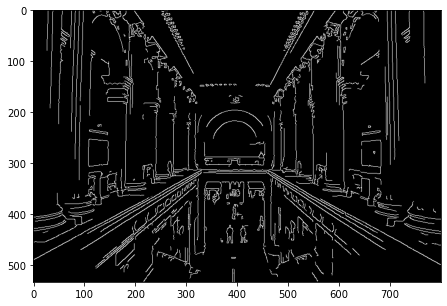

In [2]:
# test
GB_ksize = 5 # Gaussian blur kernel size
low_threshold = 160 # low threshold
high_threshold = 250 #  high threshold

img3_GBblured = cv2.GaussianBlur(img3_gray, (GB_ksize, GB_ksize), 0, 0)
img3_GBblured =cv2.equalizeHist(img3_GBblured)
img3_canny = cv2.Canny(img3_GBblured, low_threshold, high_threshold,apertureSize=3)


plt.figure(figsize=(10,5))
plt.imshow(img3_canny,cmap = 'gray')
plt.show()  

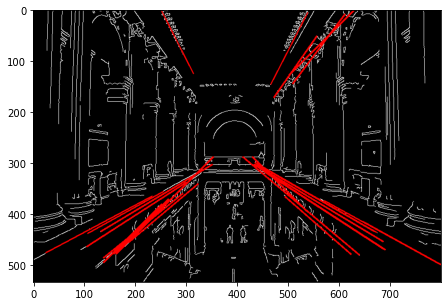

In [3]:
# HoughLinesP Parameters test
rho = 1  
theta = np.pi/180
threshold = 100
minLineLength = 100
maxLineGap = 20
# Finding Hough transform and Lines
img3_LinesP = cv2.HoughLinesP(img3_canny, rho, theta,threshold = threshold, minLineLength=minLineLength, maxLineGap=maxLineGap)

img3_RGB = cv2.cvtColor(img3_canny, cv2.COLOR_GRAY2RGB)
# filitering the Lines, use slope to select the right range of lines
LineList = []
for line in img3_LinesP:
    x1,y1,x2,y2 = line[0][0],line[0][1],line[0][2],line[0][3]
    k = abs((y1-y2)/(x1-x2+1e-6))
    if k>0.5 and k<8:
        pt1 = (x1,y1)
        pt2 = (x2,y2)
        LineList.append([pt1,pt2])
        cv2.line(img3_RGB,pt1,pt2,(255,0,0),2)
plt.figure(figsize=(10,5))
plt.imshow(img3_RGB)
plt.show()
    

In [4]:
#define a generalised function
def LineDetection(img, 
                  GB_ksize=5,low_threshold=60,high_threshold=120,
                  rho = 1, theta = np.pi/180, threshold = 30,
                  minLineLength = 100, maxLineGap = 20, equalizHist = True):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Noise filtering by Gaussian kernel，retain appropriate line information
    img_GBblured = cv2.GaussianBlur(img_gray, (GB_ksize, GB_ksize), 0, 0)
    # Enhances the contrast of the image by equalizHist and increases the distinguishability of straight lines.
    if equalizHist:
        img_GBblured =cv2.equalizeHist(img_GBblured)
    img_canny = cv2.Canny(img_GBblured, low_threshold, high_threshold,apertureSize=3, L2gradient=True)
    
    img_LinesP = cv2.HoughLinesP(img_canny, rho, theta,threshold = threshold, minLineLength=minLineLength, maxLineGap=maxLineGap)
    
    img_RGB = cv2.cvtColor(img_canny, cv2.COLOR_GRAY2RGB)
    # filitering the Lines, use slope to select the right range of lines
    LineList = []
    for line in img_LinesP:
        x1,y1,x2,y2 = line[0][0],line[0][1],line[0][2],line[0][3]
        k = abs((y1-y2)/(x1-x2+1e-6))
        if k>0.2 and k<15:
            pt1 = (x1,y1)
            pt2 = (x2,y2)
            LineList.append([pt1,pt2])
            cv2.line(img_RGB,pt1,pt2,(255,0,0),2)
    
    plt.subplots(figsize=(30, 25)) 

    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('Original image')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(img_canny, cmap='gray')  
    plt.title('Canny edges')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(img_RGB)
    plt.title('Hough Lines')
    plt.axis('off')

    plt.show() 
    return LineList

    

### 2. Locate the vanishing point
Use RANSAC to locate the vanishing point from the detected lines.

#### 2.1 RANSAC functions
Define two fuctions required by RANSAC: a function to find the point where lines intersect, and a function to compute the distance from a point to a line.

In [5]:
# Find the intersection point
def find_intersection_point(line1, line2):
    (x11, y11), (x12, y12) = line1[0],line1[1]
    (x21, y21), (x22, y22) = line2[0],line2[1]
    # for line ax+by+c=0 
    # a=y1-y2,b=x2-x1,c=x1*y2-x2*y1
    a1 = y11-y12
    b1 = x12-x11
    c1 = x11*y12-x12*y11
    
    a2 = y21-y22
    b2 = x22-x21
    c2 = x21*y22-x22*y21
    
    d = a1*b2-a2*b1
    
    if d != 0:
        x = (b1*c2-b2*c1)/d
        y = (a2*c1-a1*c2)/d
        return (x,y)
    return None
    

# Find the distance from a point to a line
def find_dist_to_line(pt, line):
    if pt == None: 
        return np.inf
    (x0, y0) = pt
    (x1, y1), (x2, y2) = line[0],line[1]
    a = y1-y2
    b = x2-x1
    c = x1*y2-x2*y1
    dist = abs(a*x0 + b*y0 + c)/math.sqrt(a**2 + b**2)
    return dist
    
    


#### 2.2 RANSAC loop
Define the main RANSAC loop

In [6]:
import math
import sys
# code adapted from tutorial 7 and https://salzis.wordpress.com/2014/06/10/robust-linear-model-estimation-using-ransac-python-implementation/
def MainRansac(LineList, ransac_iterations = 20,ransac_threshold = 3,ransac_ratio = 0.6,random_seed=90086):
    n_samples = len(LineList)
    if n_samples<=1:
        print("number of line is not enough")
        return None
    
    np.random.seed(random_seed)
    bestPt = []
    for i in range(ransac_iterations):
        indices = np.random.randint(len(LineList), size = 2)
        pt = find_intersection_point(LineList[indices[0]],LineList[indices[1]])
        if pt != None:
            num=0
            for line in LineList:
                dist = find_dist_to_line(pt,line)
                if dist < ransac_threshold:
                    num += 1
            if num/float(n_samples)>ransac_ratio:
                bestPt.append((pt,num))
    if len(bestPt)>0:
        print('found point')
        return max(bestPt,key=lambda item:item[1])[0]
    else:
        print('point not found')
        return None
                

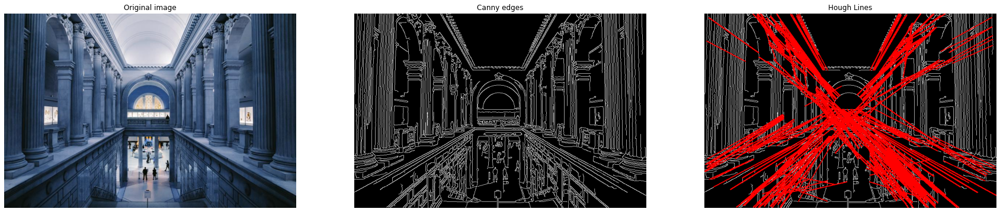

In [7]:
#test
LineListTest = LineDetection(cv2.imread('COMP90086_asst3_2021_images/img3.jpg'),
             GB_ksize=5,low_threshold=30,high_threshold=120,
                  rho = 1, theta = np.pi/180, threshold = 50,
                  minLineLength = 100, maxLineGap = 20, equalizHist = True)

In [8]:
# test
MainRansac(LineListTest, 
                             ransac_iterations = 70,
                             ransac_threshold = 10,
                             ransac_ratio = 0.4,
                             random_seed=90086)

found point


(391.6890601521981, 275.9267606999176)

### 3. Main function and evaluation
Run your vanishing point detection method on a folder of images, return the (x,y) locations of the vanishing points, and evaluate the result.

In [9]:
import pandas as pd

Test_data = pd.read_csv('vanishing_points.csv')
Test_data


,image,x,y
0,img1.jpg,404,183
1,img3.jpg,396,276
2,img6.jpg,378,258
3,img7.jpg,379,423
4,img9.jpg,438,367
5,img10.jpg,240,466
6,img13.jpg,390,260
7,img14.jpg,375,270
8,img15.jpg,416,270
9,img18.jpg,292,213


-------------------------------------------------------


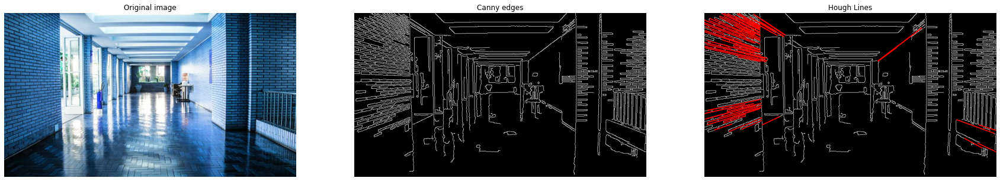

found point
img1.jpg
(406.6864499236308, 184.75496399738162)
-------------------------------------------------------


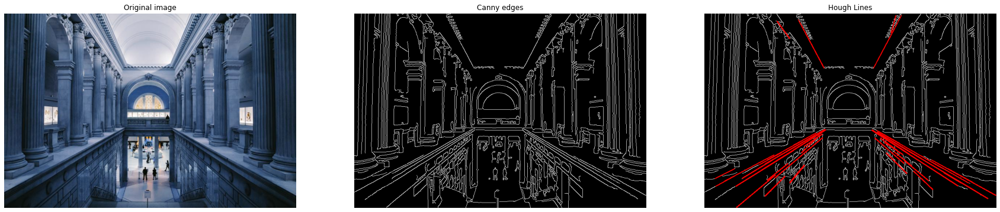

found point
img3.jpg
(390.12179887570267, 274.8532167395378)
-------------------------------------------------------


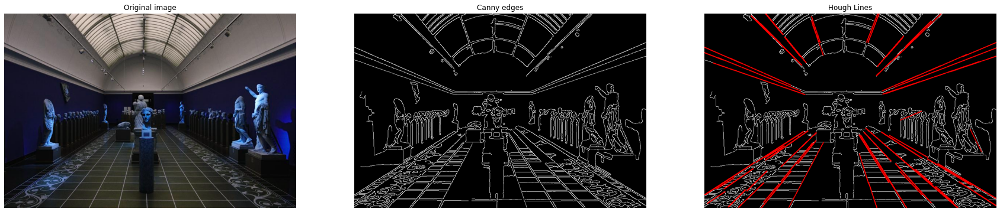

found point
img6.jpg
(378.38709677419354, 256.875)
-------------------------------------------------------


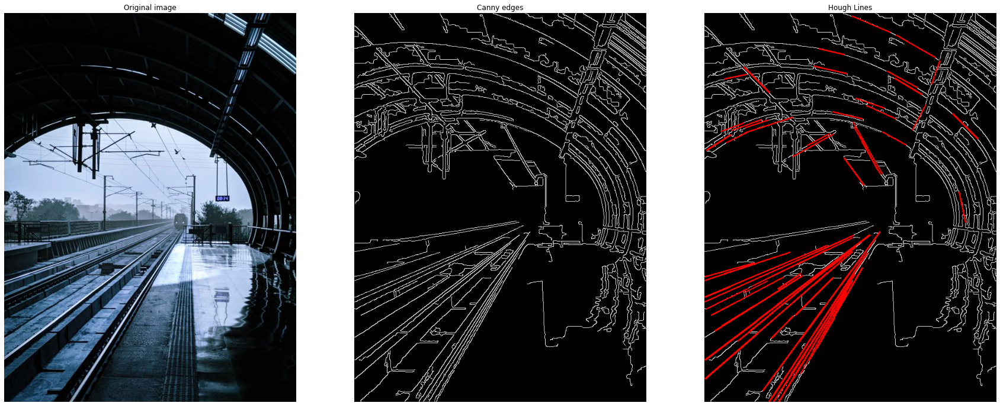

found point
img7.jpg
(373.5058307210031, 429.89241379310346)
-------------------------------------------------------


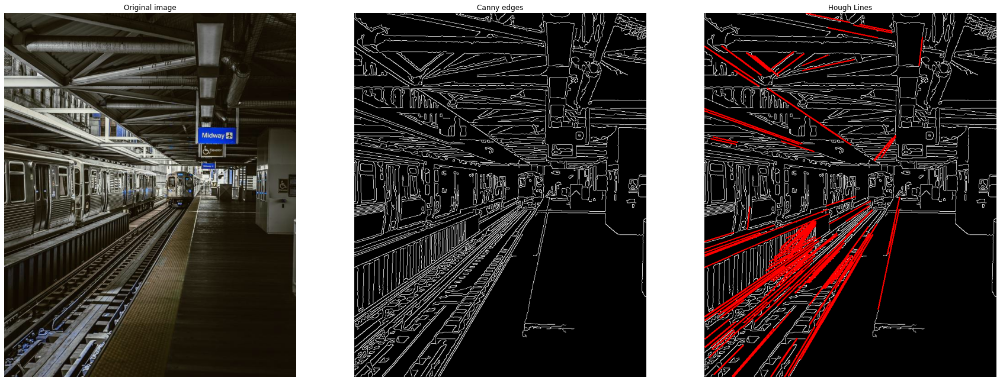

found point
img9.jpg
(439.42966142107775, 368.11254172627565)
-------------------------------------------------------


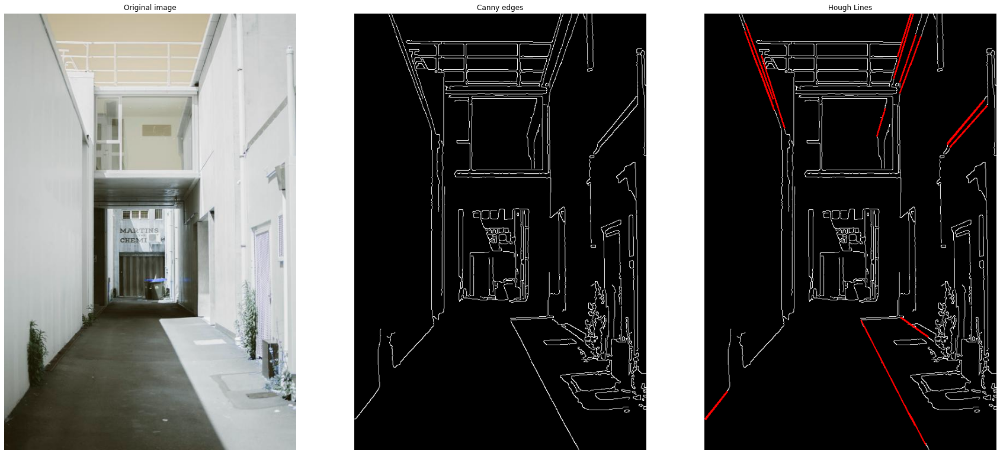

found point
img10.jpg
(238.50316535831857, 476.4044061787794)
-------------------------------------------------------


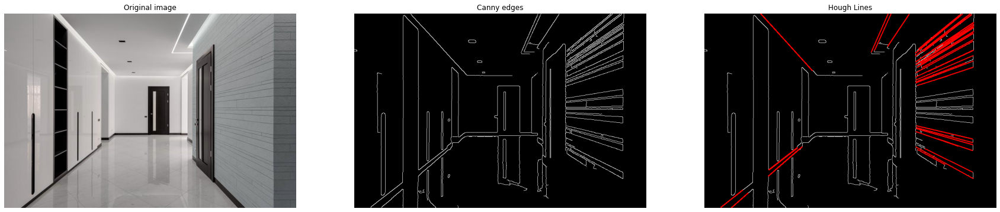

found point
img13.jpg
(388.72131147540983, 262.75956284153006)
-------------------------------------------------------


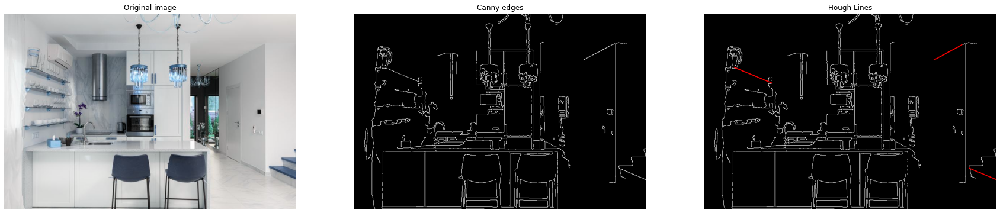

found point
img14.jpg
(362.5947005038253, 272.1815637245755)
-------------------------------------------------------


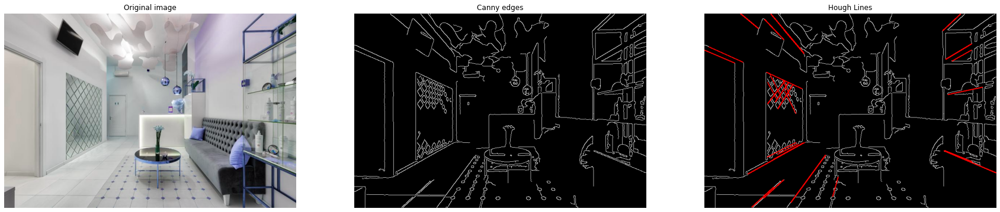

found point
img15.jpg
(416.1136363636364, 271.9318181818182)
-------------------------------------------------------


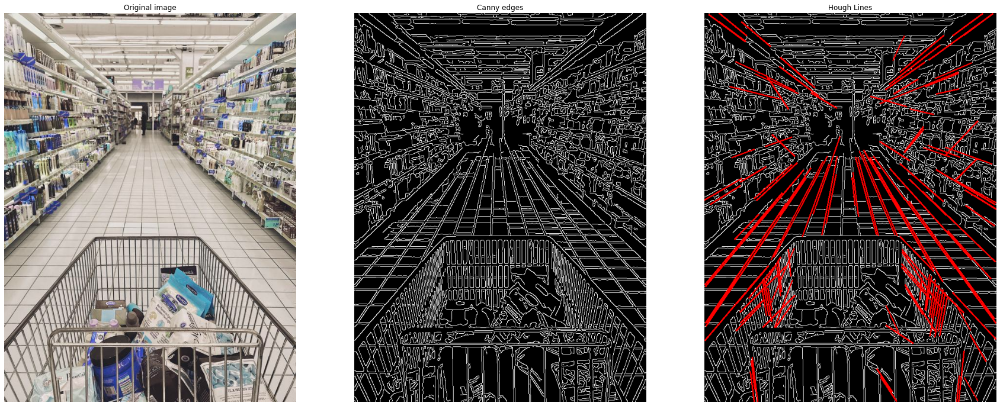

found point
img18.jpg
(292.54427645788337, 216.96976241900649)
-------------------------------------------------------


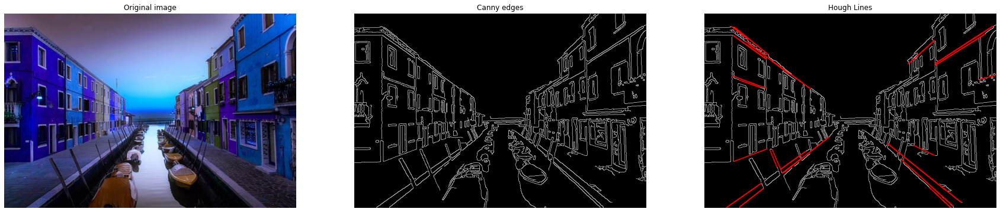

found point
img20.jpg
(400.5535393166585, 286.28292736090674)
-------------------------------------------------------


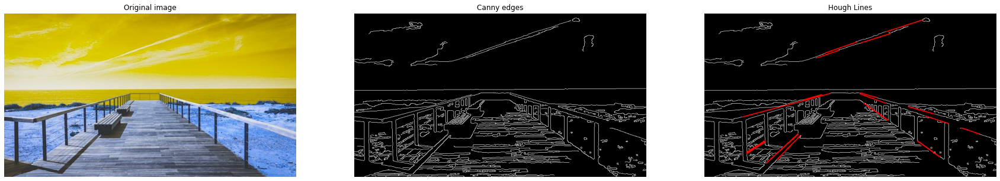

found point
img21.jpg
(393.22041900265566, 209.1233402183535)


In [10]:
# Setting threshold
GB_ksize=7
low_threshold=20
high_threshold=160
rho = 1
theta = np.pi/180
threshold = 50
minLineLength = 45
maxLineGap = 5
equalizHist = True

ransac_iterations = 70
ransac_threshold = 8
ransac_ratio = 0.5
random_seed=90086

fileList = list(Test_data['image'])
fileList
rootPath = 'COMP90086_asst3_2021_images/'
predictPts = []
# finding vanishing point for each image
for file in fileList:
    print('-------------------------------------------------------')
    LineList_Test = LineDetection(cv2.imread(rootPath + file),
                                      GB_ksize=GB_ksize,
                                      low_threshold=low_threshold,
                                      high_threshold=high_threshold,
                                      rho = rho, 
                                      theta = theta, 
                                      threshold = threshold,
                                      minLineLength = minLineLength,
                                      maxLineGap = maxLineGap,
                                      equalizHist = equalizHist)
        
    pt_Test = MainRansac(LineList_Test, 
                             ransac_iterations = ransac_iterations,
                             ransac_threshold = ransac_threshold,
                             ransac_ratio = ransac_ratio,
                             random_seed=random_seed)
    print(file)
    print(pt_Test)
    if pt_Test is not None:
        predictPts.append([pt_Test[0],pt_Test[1]])
    else:
        predictPts.append([0.0,0.0])


In [11]:
predictPts

[[406.6864499236308, 184.75496399738162],
 [390.12179887570267, 274.8532167395378],
 [378.38709677419354, 256.875],
 [373.5058307210031, 429.89241379310346],
 [439.42966142107775, 368.11254172627565],
 [238.50316535831857, 476.4044061787794],
 [388.72131147540983, 262.75956284153006],
 [362.5947005038253, 272.1815637245755],
 [416.1136363636364, 271.9318181818182],
 [292.54427645788337, 216.96976241900649],
 [400.5535393166585, 286.28292736090674],
 [393.22041900265566, 209.1233402183535]]

In [12]:
 Test_data 

,image,x,y
0,img1.jpg,404,183
1,img3.jpg,396,276
2,img6.jpg,378,258
3,img7.jpg,379,423
4,img9.jpg,438,367
5,img10.jpg,240,466
6,img13.jpg,390,260
7,img14.jpg,375,270
8,img15.jpg,416,270
9,img18.jpg,292,213


In [13]:
# evaluate result
def EuclideanDistance(x1,y1,x2,y2):
    return math.sqrt((x1-x2)**2 + (y1-y2)**2)

EDs = []

for i in range(len(predictPts)):
    x1,y1 = predictPts[i][0],predictPts[i][1]
    x2 = Test_data['x'][i]
    y2 = Test_data['y'][i]
    EDs.append(EuclideanDistance(x1,y1,x2,y2))
print(EDs)
MSE = 0
for ed in EDs:
    MSE += ed**2
if len(EDs)>0:
    MSE = MSE/len(EDs)
    print(MSE)
else: 
    print('error')

[3.208880151124619, 5.989019978608082, 1.1897348076739802, 8.81426479983645, 1.8115410212364687, 10.511526144074468, 3.041419310005118, 12.595660993936578, 1.9351575415825513, 4.006900363867598, 5.710715578901439, 4.36735959180687]
39.86941354243894
